In [1]:
#Loading Libraries

import os 
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import random
import splitfolders
import tensorflow as tf
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Dense,Conv2D,Dropout,Flatten,MaxPooling2D, BatchNormalization,Input,concatenate
from keras.callbacks import EarlyStopping,ReduceLROnPlateau
from keras.utils import plot_model
from sklearn.metrics import classification_report, confusion_matrix


In [2]:
#Data Extraction

# Path where our data is located
base_path = "C:\\Users\\punit\\MA3832 Neural Network and Deep Learning\\asl_dataset\\"

# Dictionary to save our 36 classes
categories = {  0: "0",
                1: "1",
                2: "2",
                3: "3",
                4: "4",
                5: "5",
                6: "6",
                7: "7",
                8: "8",
                9: "9",
                10: "a",
                11: "b",
                12: "c",
                13: "d",
                14: "e",
                15: "f",
                16: "g",
                17: "h",
                18: "i",
                19: "j",
                20: "k",
                21: "l",
                22: "m",
                23: "n",
                24: "o",
                25: "p",
                26: "q",
                27: "r",
                28: "s",
                29: "t",
                30: "u",
                31: "v",
                32: "w",
                33: "x",
                34: "y",
                35: "z",
            }

def add_class_name_prefix(df, col_name):
    df[col_name] = df[col_name].apply(
        lambda x: x[re.search("_", x).start() + 1 : re.search("_", x).start() + 2]
        + "/"
        + x
    )
    return df


# list conatining all the filenames in the dataset
filenames_list = []
# list to store the corresponding category, note that each folder of the dataset has one class of data
categories_list = []

print("Base Path:", base_path)

for category in categories:
    filenames = os.listdir(base_path + categories[category])
    filenames_list = filenames_list + filenames
    categories_list = categories_list + [category] * len(filenames)

df = pd.DataFrame({"filename": filenames_list, "category": categories_list})
df = add_class_name_prefix(df, "filename")

print("DataFrame Sample:")
print(df.head())

# Shuffle the dataframe
df = df.sample(frac=1).reset_index(drop=True)

Base Path: C:\Users\punit\MA3832 Neural Network and Deep Learning\asl_dataset\
DataFrame Sample:
                           filename  category
0  0/hand1_0_bot_seg_1_cropped.jpeg         0
1  0/hand1_0_bot_seg_2_cropped.jpeg         0
2  0/hand1_0_bot_seg_3_cropped.jpeg         0
3  0/hand1_0_bot_seg_4_cropped.jpeg         0
4  0/hand1_0_bot_seg_5_cropped.jpeg         0


In [3]:
df

,filename,category
0,a/hand4_a_bot_seg_2_cropped.jpeg,10
1,g/hand2_g_right_seg_1_cropped.jpeg,16
2,q/hand1_q_right_seg_1_cropped.jpeg,26
3,5/hand1_5_bot_seg_5_cropped.jpeg,5
4,2/hand2_2_top_seg_4_cropped.jpeg,2
...,...,...
2510,l/hand1_l_left_seg_4_cropped.jpeg,21
2511,u/hand3_u_dif_seg_2_cropped.jpeg,30
2512,0/hand1_0_top_seg_1_cropped.jpeg,0
2513,y/hand1_y_left_seg_3_cropped.jpeg,34


In [4]:
print("number of elements = ", len(df))

number of elements =  2515


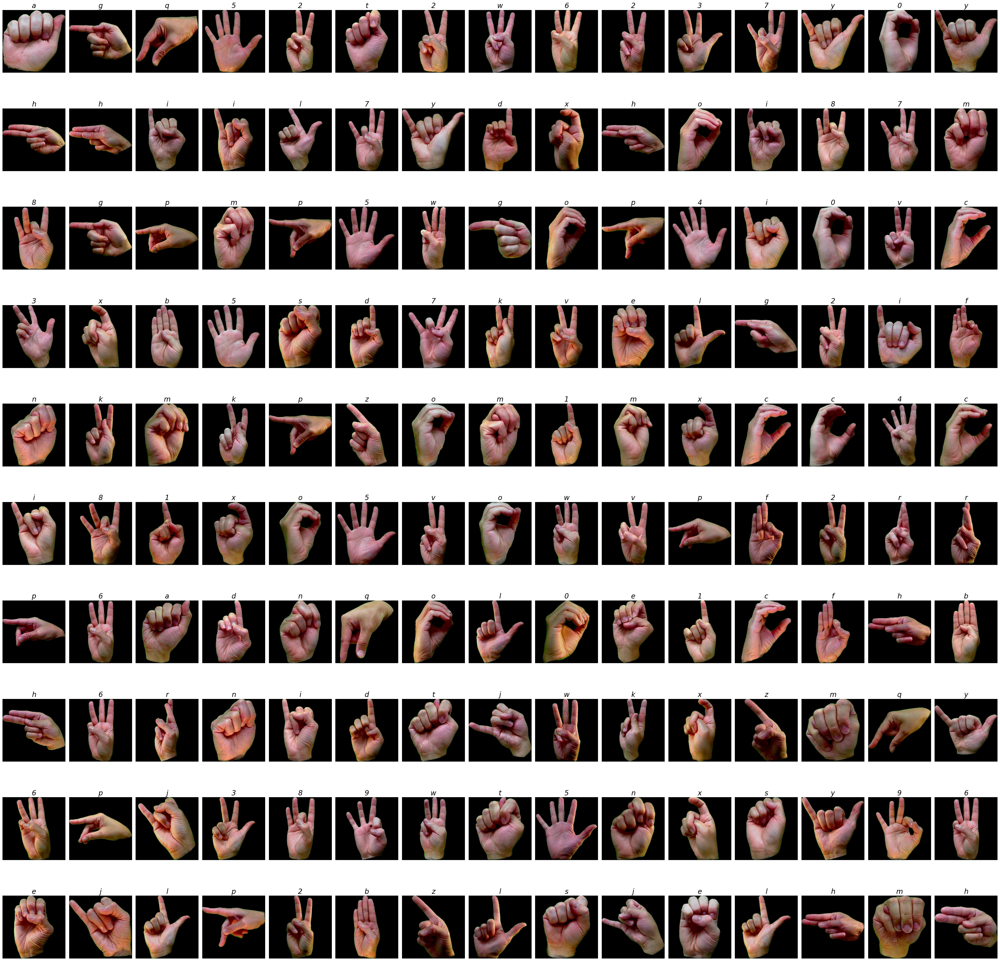

In [5]:
#Data Exploration

plt.figure(figsize=(40, 40))

# Define the number of rows and columns in your grid
num_rows = 10
num_columns = 15

# Calculate the total number of subplots
total_subplots = num_rows * num_columns

for i in range(total_subplots):
    if i < len(df):
        path = base_path + df.filename[i]
        img = plt.imread(path)
        plt.subplot(num_rows, num_columns, i + 1)
        plt.imshow(img)
        plt.title(categories[df.category[i]], fontsize=20, fontstyle='italic')
        plt.axis("off")

plt.tight_layout()  # Ensure proper spacing between subplots
plt.show()


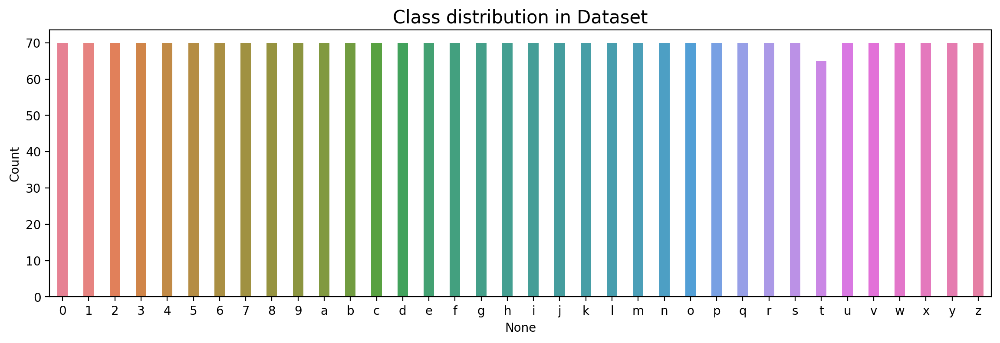

In [6]:
label,count = np.unique(df.category,return_counts=True)
uni = pd.DataFrame(data=count,index=categories.values(),columns=['Count'])

plt.figure(figsize=(14,4),dpi=200)
sns.barplot(data=uni, x=uni.index, y='Count', hue=uni.index, palette='husl', width=0.4, legend=False)
plt.title('Class distribution in Dataset', fontsize=15)
plt.show()

In [7]:
#Train Test Split

# Define the source directory where your dataset is located
source_dir = "C:\\Users\\punit\\MA3832 Neural Network and Deep Learning\\asl_dataset\\"

# Define the output directory where the split dataset will be saved
output_dir = "C:\\Users\\punit\\MA3832 Neural Network and Deep Learning\\asl_dataset_split\\"

# Define the seed for reproducibility
seed = 1234

# Define the ratio for splitting (80% train, 10% validation, 10% test)
ratio = (0.8, 0.1, 0.1)

# Use splitfolders to perform the splitting
splitfolders.ratio(source_dir, output=output_dir, seed=seed, ratio=ratio)


Copying files: 2515 files [00:15, 166.94 files/s]


In [8]:
# Data Preparation

# Image Data Generator
datagen = ImageDataGenerator(rescale=1.0 / 255)

# Define the directory paths for your dataset split
train_path = "C:\\Users\\punit\\MA3832 Neural Network and Deep Learning\\asl_dataset_split\\train"
val_path = "C:\\Users\\punit\\MA3832 Neural Network and Deep Learning\\asl_dataset_split\\val"
test_path = "C:\\Users\\punit\\MA3832 Neural Network and Deep Learning\\asl_dataset_split\\test"

batch = 32
image_size = 200
img_channel = 3
n_classes = 36

train_data = datagen.flow_from_directory(directory= train_path, 
                                         target_size=(image_size,image_size), 
                                         batch_size = batch, 
                                         class_mode='categorical')

val_data = datagen.flow_from_directory(directory= val_path, 
                                       target_size=(image_size,image_size), 
                                       batch_size = batch, 
                                       class_mode='categorical',
                                       )

test_data = datagen.flow_from_directory(directory= test_path, 
                                         target_size=(image_size,image_size), 
                                         batch_size = batch, 
                                         class_mode='categorical',
                                         shuffle= False)

Found 2012 images belonging to 36 classes.
Found 251 images belonging to 36 classes.
Found 252 images belonging to 36 classes.


In [9]:
print("Number of training samples:", train_data.samples)
print("Number of validation samples:", val_data.samples)
print("Number of test samples:", test_data.samples)
print("Number of classes:", n_classes)


Number of training samples: 2012
Number of validation samples: 251
Number of test samples: 252
Number of classes: 36


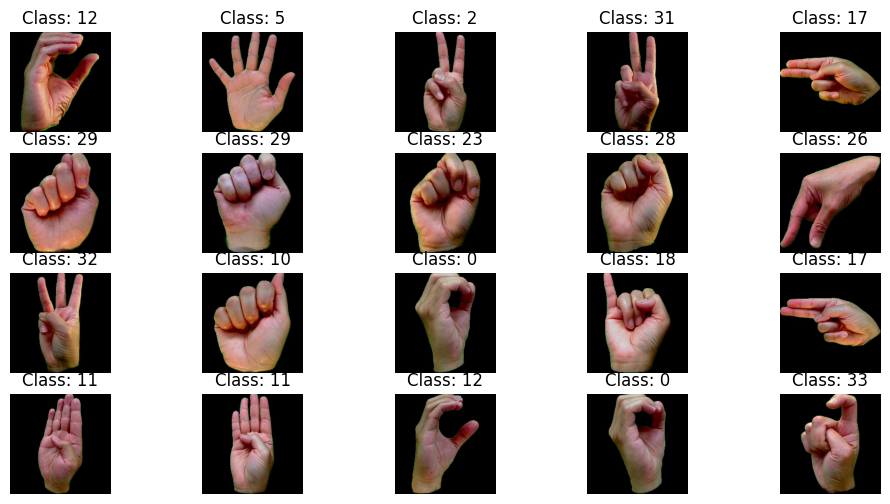

In [10]:
# Get a batch of images and labels from the training dataset
batch_images, batch_labels = next(train_data)

# Plot some sample images
plt.figure(figsize=(12, 6))
for i in range(20):  # Change the range to display more or fewer images
    plt.subplot(4, 5, i + 1)
    plt.imshow(batch_images[i])
    plt.title("Class: " + str(batch_labels[i].argmax()))  # Display the class label
    plt.axis("off")
plt.show()

In [11]:
model = Sequential()
# input layer
# Block 1
model.add(Conv2D(32,3,activation='relu',padding='same',input_shape = (image_size,image_size,img_channel)))
model.add(Conv2D(32,3,activation='relu',padding='same'))
#model.add(BatchNormalization())
model.add(MaxPooling2D(padding='same'))
model.add(Dropout(0.2))

# Block 2
model.add(Conv2D(64,3,activation='relu',padding='same'))
model.add(Conv2D(64,3,activation='relu',padding='same'))
#model.add(BatchNormalization())
model.add(MaxPooling2D(padding='same'))
model.add(Dropout(0.3))

#Block 3
model.add(Conv2D(128,3,activation='relu',padding='same'))
model.add(Conv2D(128,3,activation='relu',padding='same'))
#model.add(BatchNormalization())
model.add(MaxPooling2D(padding='same'))
model.add(Dropout(0.4))

# fully connected layer
model.add(Flatten())
model.add(Dense(512,activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(128,activation='relu'))
model.add(Dropout(0.3))

# output layer
model.add(Dense(36, activation='softmax'))

model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 200, 200, 32)      896       
                                                                 
 conv2d_1 (Conv2D)           (None, 200, 200, 32)      9248      
                                                                 
 max_pooling2d (MaxPooling2  (None, 100, 100, 32)      0         
 D)                                                              
                                                                 
 dropout (Dropout)           (None, 100, 100, 32)      0         
                                                                 
 conv2d_2 (Conv2D)           (None, 100, 100, 64)      18496     
                                                                 
 conv2d_3 (Conv2D)           (None, 100, 100, 64)      36928     
                                                        

In [12]:
#Callbacks
early_stoping = EarlyStopping(monitor='val_loss', 
                              min_delta=0.001,
                              patience= 5,
                              restore_best_weights= True, 
                              verbose = 0)

reduce_learning_rate = ReduceLROnPlateau(monitor='val_accuracy', 
                                         patience = 2, 
                                         factor=0.5 , 
                                         verbose = 1)


In [13]:
#Compile the model
model.compile(optimizer='adam', loss = 'categorical_crossentropy' , metrics=['accuracy'])

In [14]:
#Fit The model
asl_class = model.fit(train_data, 
                      validation_data= val_data, 
                      epochs=30, 
                      callbacks=[early_stoping,reduce_learning_rate],
                      verbose = 1)

Epoch 1/30
63/63 [==============================] - 268s 4s/step - loss: 2.1558 - accuracy: 0.4210 - val_loss: 0.5963 - val_accuracy: 0.8048 - lr: 0.0010
Epoch 2/30
63/63 [==============================] - 256s 4s/step - loss: 0.5794 - accuracy: 0.8211 - val_loss: 0.2109 - val_accuracy: 0.9283 - lr: 0.0010
Epoch 3/30
63/63 [==============================] - 254s 4s/step - loss: 0.3259 - accuracy: 0.8907 - val_loss: 0.1349 - val_accuracy: 0.9602 - lr: 0.0010
Epoch 4/30
63/63 [==============================] - 250s 4s/step - loss: 0.1715 - accuracy: 0.9443 - val_loss: 0.0786 - val_accuracy: 0.9641 - lr: 0.0010
Epoch 5/30
63/63 [==============================] - 257s 4s/step - loss: 0.1306 - accuracy: 0.9573 - val_loss: 0.1610 - val_accuracy: 0.9562 - lr: 0.0010
Epoch 6/30
63/63 [==============================] - 249s 4s/step - loss: 0.1091 - accuracy: 0.9602 - val_loss: 0.0952 - val_accuracy: 0.9681 - lr: 0.0010
Epoch 7/30
63/63 [==============================] - 250s 4s/step - loss: 0.0

In [15]:
# Evaluation
# Evaluate for train generator
loss,acc = model.evaluate(train_data , verbose = 0)

print('The accuracy of the model for training data is:',acc*100)
print('The Loss of the model for training data is:',loss)

# Evaluate for validation generator
loss,acc = model.evaluate(val_data, verbose = 0)

print('The accuracy of the model for validation data is:',acc*100)
print('The Loss of the model for validation data is:',loss)

The accuracy of the model for training data is: 99.80119466781616
The Loss of the model for training data is: 0.003659179899841547
The accuracy of the model for validation data is: 97.60956168174744
The Loss of the model for validation data is: 0.06394387036561966


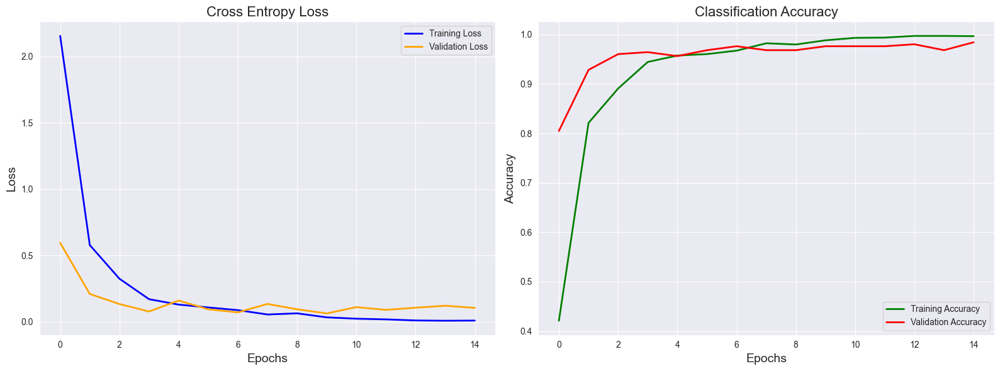

In [20]:
# plots for accuracy and Loss with epochs

# Create a figure with subplots
plt.figure(figsize=(16, 6))

# Subplot 1: Cross Entropy Loss
plt.subplot(1, 2, 1)
plt.plot(error['loss'], label='Training Loss', color='blue', linewidth=2)
plt.plot(error['val_loss'], label='Validation Loss', color='orange', linewidth=2)
plt.title('Cross Entropy Loss', fontsize=16)
plt.xlabel('Epochs', fontsize=14)
plt.ylabel('Loss', fontsize=14)
plt.legend()
plt.grid(True)

# Subplot 2: Classification Accuracy
plt.subplot(1, 2, 2)
plt.plot(error['accuracy'], label='Training Accuracy', color='green', linewidth=2)
plt.plot(error['val_accuracy'], label='Validation Accuracy', color='red', linewidth=2)
plt.title('Classification Accuracy', fontsize=16)
plt.xlabel('Epochs', fontsize=14)
plt.ylabel('Accuracy', fontsize=14)
plt.legend()
plt.grid(True)

# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()


In [26]:
# Perform predictions on the test dataset

# Predict using the trained model on the test data
result = model.predict(test_data, verbose=0)

# Extract the predicted class labels by selecting the class with the highest probability
y_pred = np.argmax(result, axis=1)

# Get the true class labels from the test data generator
y_true = test_data.labels

# Evaluate the model on the test dataset

# Evaluate the model's performance on the test data and retrieve loss and accuracy
loss, acc = model.evaluate(test_data, verbose=0)

# Print the accuracy and loss metrics for the testing data
print('The accuracy of the model for testing data is:', acc * 100)
print('The Loss of the model for testing data is:', loss)


The accuracy of the model for testing data is: 96.82539701461792
The Loss of the model for testing data is: 0.1789255142211914


In [27]:
# Calculate the number of correct and incorrect predictions

# Predicted class labels
p = y_pred
# True class labels
t = y_true

# Indices where predictions match true labels (correct predictions)
correct = np.nonzero(p == t)[0]

# Indices where predictions do not match true labels (incorrect predictions)
incorrect = np.nonzero(p != t)[0]

# Print the number of correct and incorrect predictions
print("Correctly Predicted Classes:", correct.shape[0])
print("Incorrectly Predicted Classes:", incorrect.shape[0])


Correctly Predicted Classes: 244
Incorrectly Predicted Classes: 8


In [30]:
# Generate a classification report to assess model performance

# `y_true` represents the true class labels
# `y_pred` represents the predicted class labels
# `target_names` is used to specify the names of the classes/categories

print(classification_report(y_true, y_pred, target_names=categories.values()))

              precision    recall  f1-score   support

           0       1.00      0.71      0.83         7
           1       1.00      1.00      1.00         7
           2       1.00      1.00      1.00         7
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00         7
           5       1.00      1.00      1.00         7
           6       0.88      1.00      0.93         7
           7       1.00      1.00      1.00         7
           8       1.00      1.00      1.00         7
           9       1.00      1.00      1.00         7
           a       1.00      0.86      0.92         7
           b       1.00      1.00      1.00         7
           c       1.00      1.00      1.00         7
           d       1.00      0.86      0.92         7
           e       1.00      1.00      1.00         7
           f       1.00      0.86      0.92         7
           g       0.88      1.00      0.93         7
           h       1.00    

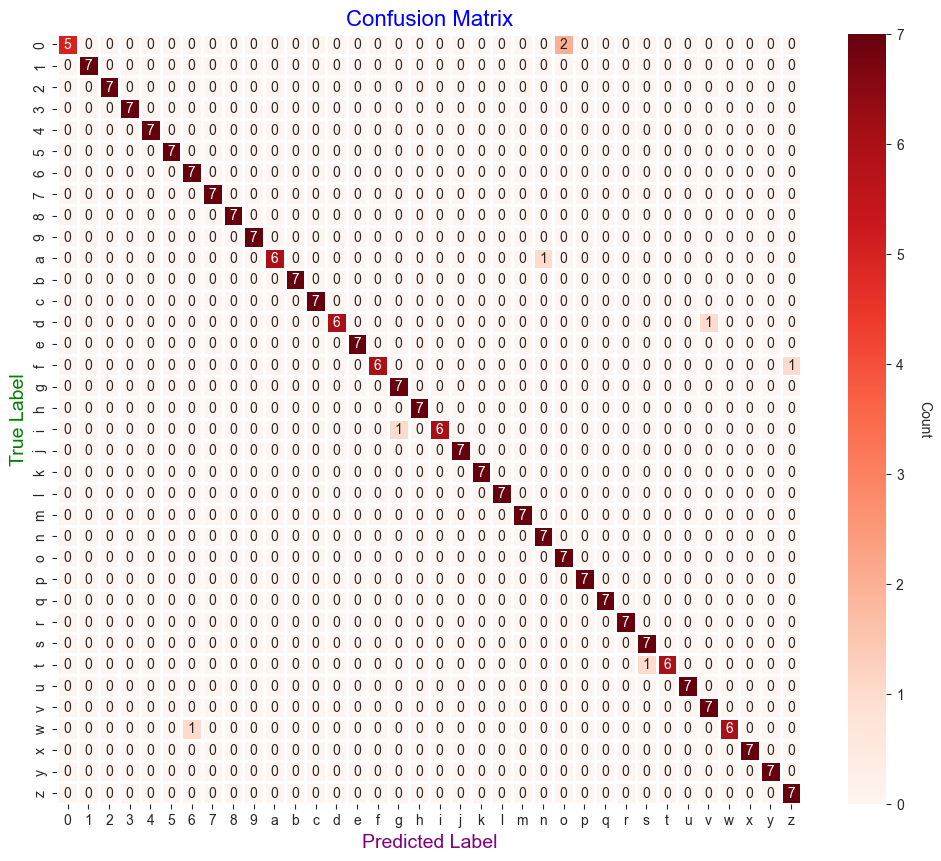

In [36]:
# Create a figure and axis for the heatmap
f, ax = plt.subplots(figsize=(12, 10))

# Create the heatmap using seaborn
sns.heatmap(confusion_mtx, annot=True, 
            linewidths=1, cmap="Reds", 
            fmt='.0f', ax=ax, 
            cbar=True, xticklabels=categories.values(), 
            yticklabels=categories.values())

# Set labels and title for the plot
plt.xlabel("Predicted Label", fontdict={'color': 'purple', 'size': 14})
plt.ylabel("True Label", fontdict={'color': 'green', 'size': 14})
plt.title("Confusion Matrix", fontdict={'color': 'blue', 'size': 16})

# Customize color bar
cbar = ax.collections[0].colorbar
cbar.set_label('Count', rotation=270, labelpad=20)

# Show the plot
plt.show()


In [40]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Load the pre-trained model with weights
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(image_size, image_size, img_channel))

# Add a custom output layer for your specific task
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(n_classes, activation='softmax')(x)

# Create the transfer learning model
model = Model(inputs=base_model.input, outputs=predictions)

# Define the number of epochs
epochs = 10

# Define callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=1e-7)

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model on your ASL dataset
transfer_learning_history = model.fit(train_data, validation_data=val_data, epochs=epochs, verbose=1, callbacks=[early_stopping, reduce_lr])

# Evaluate the model on validation and test datasets
val_loss, val_acc = model.evaluate(val_data)
test_loss, test_acc = model.evaluate(test_data)

# Compare and discuss the results with benchmark models


Epoch 1/10
63/63 [==============================] - 757s 12s/step - loss: 1.9310 - accuracy: 0.4657 - val_loss: 0.4942 - val_accuracy: 0.8486 - lr: 1.0000e-04
Epoch 2/10
63/63 [==============================] - 726s 12s/step - loss: 0.3570 - accuracy: 0.8743 - val_loss: 0.1719 - val_accuracy: 0.9482 - lr: 1.0000e-04
Epoch 3/10
63/63 [==============================] - 738s 12s/step - loss: 0.1936 - accuracy: 0.9279 - val_loss: 0.1226 - val_accuracy: 0.9442 - lr: 1.0000e-04
Epoch 4/10
63/63 [==============================] - 741s 12s/step - loss: 0.1483 - accuracy: 0.9503 - val_loss: 0.1669 - val_accuracy: 0.9442 - lr: 1.0000e-04
Epoch 5/10
63/63 [==============================] - 744s 12s/step - loss: 0.1109 - accuracy: 0.9642 - val_loss: 0.0757 - val_accuracy: 0.9681 - lr: 1.0000e-04
Epoch 6/10
63/63 [==============================] - 748s 12s/step - loss: 0.0923 - accuracy: 0.9667 - val_loss: 0.0521 - val_accuracy: 0.9801 - lr: 1.0000e-04
Epoch 7/10
63/63 [============================

In [43]:
# Evaluation
# Evaluate for train generator
train_loss, train_acc = model.evaluate(train_data, verbose=0)
print('The accuracy of the model for training data is:', train_acc * 100)
print('The Loss of the model for training data is:', train_loss)

# Evaluate the model on validation dataset
print('The accuracy of the model for validation data is:', val_acc * 100)
print('The Loss of the model for validation data is:', val_loss)

# Evaluate the model on test dataset
print('The accuracy of the model for test data is:', test_acc * 100)
print('The Loss of the model for test data is:', test_loss)


The accuracy of the model for training data is: 100.0
The Loss of the model for training data is: 0.0022616726346313953
The accuracy of the model for validation data is: 99.60159659385681
The Loss of the model for validation data is: 0.01116271037608385
The accuracy of the model for test data is: 98.8095223903656
The Loss of the model for test data is: 0.01759868487715721


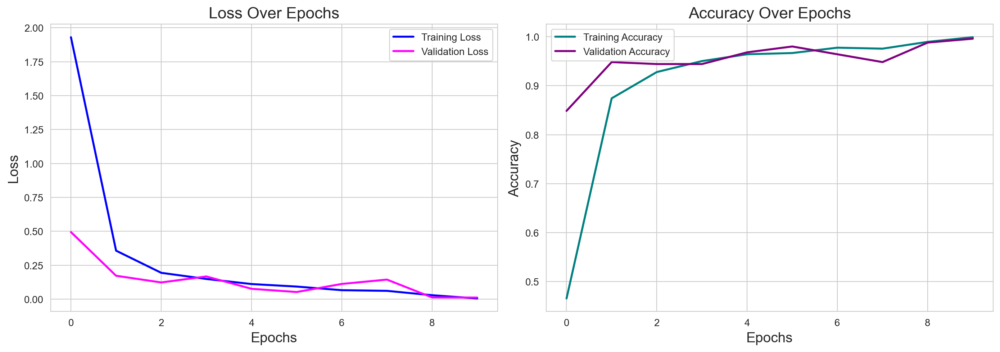

In [56]:
# Get training and validation loss and accuracy from history
train_loss = transfer_learning_history.history['loss']
val_loss = transfer_learning_history.history['val_loss']
train_acc = transfer_learning_history.history['accuracy']
val_acc = transfer_learning_history.history['val_accuracy']

# Create subplots for loss and accuracy
plt.figure(figsize=(14, 5), dpi=200)
plt.subplot(1, 2, 1)
plt.plot(train_loss, label='Training Loss', color='Blue', linewidth=2)
plt.plot(val_loss, label='Validation Loss',  color='Magenta', linewidth=2)
plt.title('Loss Over Epochs', fontsize=16)
plt.xlabel('Epochs', fontsize=14)
plt.ylabel('Loss', fontsize=14)
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_acc, label='Training Accuracy', color='Teal', linewidth=2)
plt.plot(val_acc, label='Validation Accuracy', color='Purple', linewidth=2)
plt.title('Accuracy Over Epochs', fontsize=16)
plt.xlabel('Epochs', fontsize=14)
plt.ylabel('Accuracy', fontsize=14)
plt.legend()

# Adjust spacing between subplots
plt.tight_layout()

plt.show()


In [48]:
# Predict labels for the test dataset using the VGG16 model
vgg16_predictions = model.predict(test_data, verbose=0)
vgg16_predicted_labels = np.argmax(vgg16_predictions, axis=1)

# Get the true labels for the test dataset
true_labels = test_data.classes

# Calculate the number of correct and incorrect predictions
correct_predictions = np.sum(vgg16_predicted_labels == true_labels)
incorrect_predictions = len(true_labels) - correct_predictions

print('Number of Correct Predictions:', correct_predictions)
print('Number of Incorrect Predictions:', incorrect_predictions)


Number of Correct Predictions: 249
Number of Incorrect Predictions: 3


In [49]:
# Generate a classification report
classification_rep = classification_report(true_labels, vgg16_predicted_labels, target_names=categories.values())
print("Classification Report:\n", classification_rep)

Classification Report:
               precision    recall  f1-score   support

           0       0.75      0.86      0.80         7
           1       1.00      1.00      1.00         7
           2       1.00      1.00      1.00         7
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00         7
           5       1.00      1.00      1.00         7
           6       1.00      1.00      1.00         7
           7       1.00      1.00      1.00         7
           8       1.00      1.00      1.00         7
           9       1.00      1.00      1.00         7
           a       1.00      1.00      1.00         7
           b       1.00      1.00      1.00         7
           c       1.00      1.00      1.00         7
           d       1.00      1.00      1.00         7
           e       1.00      1.00      1.00         7
           f       1.00      1.00      1.00         7
           g       1.00      1.00      1.00         7
   

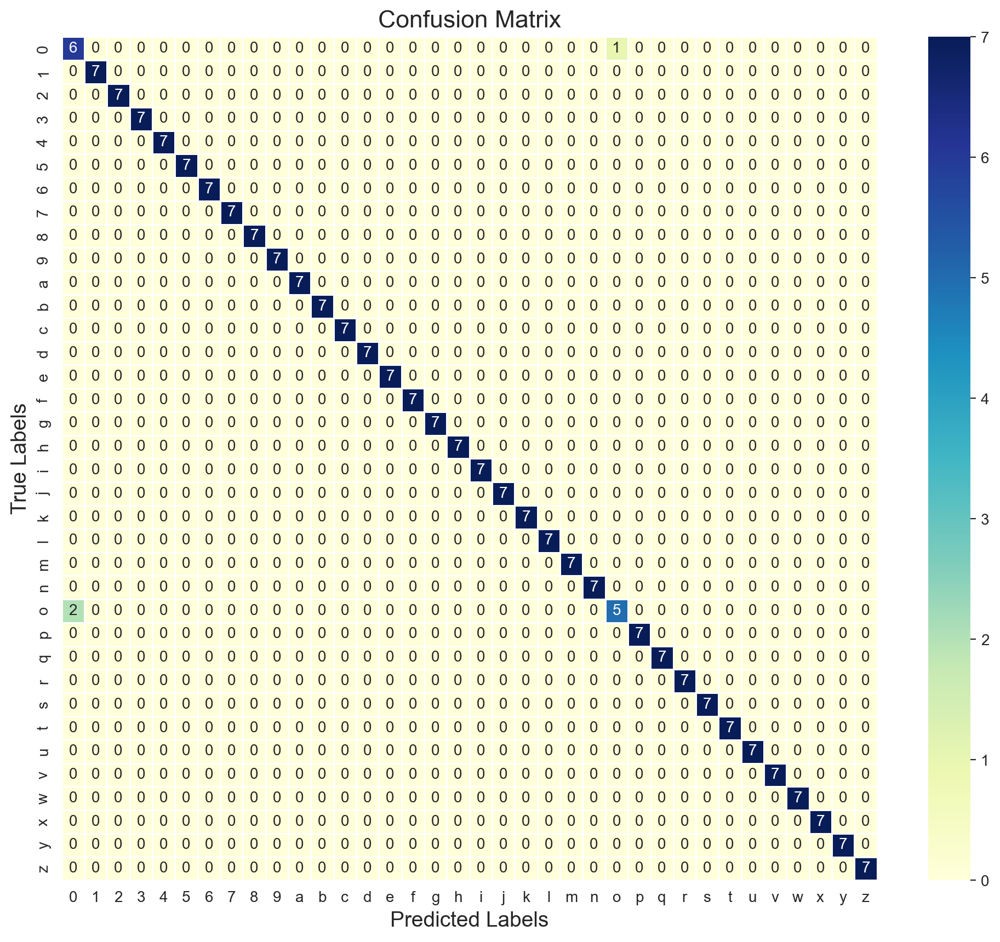

In [61]:
# Generate a confusion matrix
confusion_mtx = confusion_matrix(true_labels, vgg16_predicted_labels)

# Create a heatmap for the confusion matrix
plt.figure(figsize=(12, 10), dpi=200)
sns.set_style('whitegrid')
sns.heatmap(confusion_mtx, annot=True, linewidths=1, fmt='d', cmap='YlGnBu', xticklabels=categories.values(), yticklabels=categories.values())
plt.xlabel('Predicted Labels', fontsize=14)
plt.ylabel('True Labels', fontsize=14)
plt.title('Confusion Matrix', fontsize=16)
plt.show()
